In [1]:
!nvidia-smi
import torch

print("torch:", torch.__version__)
print("cuda available:", torch.cuda.is_available())
print("device:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU")


Wed Dec 17 02:14:08 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   52C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
%cd/content
!rm -rf TAM
!git clone https: // github.com/xmed-lab/TAM
%cd/content/TAM
!ls -la


/content
Cloning into 'TAM'...
remote: Enumerating objects: 41, done.
remote: Counting objects: 100% (41/41), done.
remote: Compressing objects: 100% (35/35), done.
remote: Total 41 (delta 11), reused 32 (delta 6), pack-reused 0 (from 0)
Receiving objects: 100% (41/41), 4.53 MiB | 11.55 MiB/s, done.
Resolving deltas: 100% (11/11), done.
/content/TAM
total 100
drwxr-xr-x 4 root root  4096 Dec 17 02:14 .
drwxr-xr-x 1 root root  4096 Dec 17 02:14 ..
-rw-r--r-- 1 root root  6109 Dec 17 02:14 demo.py
-rw-r--r-- 1 root root 23928 Dec 17 02:14 eval.py
drwxr-xr-x 8 root root  4096 Dec 17 02:14 .git
drwxr-xr-x 3 root root  4096 Dec 17 02:14 imgs
-rw-r--r-- 1 root root 12605 Dec 17 02:14 qwen_utils.py
-rw-r--r-- 1 root root  3739 Dec 17 02:14 README.md
-rw-r--r-- 1 root root   165 Dec 17 02:14 requirements.txt
-rw-r--r-- 1 root root 26531 Dec 17 02:14 tam.py


In [3]:
!apt-get update -y
!apt-get install -y texlive-xetex poppler-utils


Get:1 https://cli.github.com/packages stable InRelease [3,917 B]
Get:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:4 https://cli.github.com/packages stable/main amd64 Packages [345 B]
Get:5 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:6 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:7 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:8 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [2,205 kB]
Get:9 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:10 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:11 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:12 https://r2u.stat.illinois.edu/ubuntu jammy/main all Packages [9,546 kB]
Hit:13 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu j

In [4]:
import subprocess, sys, textwrap, os


def run(cmd):
    print(">>", cmd)
    r = subprocess.run(cmd, shell=True)
    if r.returncode != 0:
        raise RuntimeError(f"Command failed: {cmd}")


# как в README
run("pip -q install -r requirements.txt")

# Qwen2-VL живёт в новых transformers
run("pip -q install -U 'transformers>=4.43.0' accelerate safetensors sentencepiece")

print("OK")

>> pip -q install -r requirements.txt
>> pip -q install -U 'transformers>=4.43.0' accelerate safetensors sentencepiece
OK


In [6]:
# 20 картинок для задачи есть ли человек
# Получится:
#  /content/coco20/images/*.jpg
#  image_paths = список путей (20)
#  labels_gt = список 0/1 (1=есть человек)
#  QUESTION = правильный вопрос для TAM

!pip -q install requests tqdm

import os, json, random, zipfile, requests
from tqdm import tqdm

random.seed(42)

OUT_DIR = "/content/coco20/images"
os.makedirs(OUT_DIR, exist_ok=True)

# Скачиваем аннотации COCO 2017 (train+val) и берём instances_val2017.json
ann_zip_url = "http://images.cocodataset.org/annotations/annotations_trainval2017.zip"
ann_zip_path = "/content/coco20/annotations_trainval2017.zip"
ann_json_path = "/content/coco20/instances_val2017.json"

if not os.path.exists(ann_json_path):
    print("Downloading annotations zip...")
    r = requests.get(ann_zip_url, stream=True, timeout=120)
    r.raise_for_status()
    with open(ann_zip_path, "wb") as f:
        for chunk in r.iter_content(chunk_size=1024 * 1024):
            if chunk:
                f.write(chunk)

    print("Extracting instances_val2017.json...")
    with zipfile.ZipFile(ann_zip_path, "r") as z:
        z.extract("annotations/instances_val2017.json", path="/content/coco20")
    os.rename("/content/coco20/annotations/instances_val2017.json", ann_json_path)

print("Loading annotations...")
with open(ann_json_path, "r") as f:
    coco = json.load(f)

# Находим category_id для "person"
person_cat = None
for c in coco["categories"]:
    if c["name"] == "person":
        person_cat = c["id"]
        break
assert person_cat is not None, "Не нашёл категорию 'person' в COCO."

# Маппинг image_id -> file_name
id2file = {img["id"]: img["file_name"] for img in coco["images"]}
all_img_ids = set(id2file.keys())

# Собираем множество image_id где есть человек
with_person = set()
for ann in coco["annotations"]:
    if ann["category_id"] == person_cat:
        with_person.add(ann["image_id"])

without_person = list(all_img_ids - with_person)
with_person = list(with_person)

print("Images with person:", len(with_person))
print("Images without person:", len(without_person))

# Берём 10 + 10 (можешь поменять)
N_POS = 10
N_NEG = 10
pos_ids = random.sample(with_person, N_POS)
neg_ids = random.sample(without_person, N_NEG)


# Скачиваем картинки
def download_image(url, out_path):
    rr = requests.get(url, stream=True, timeout=60)
    rr.raise_for_status()
    with open(out_path, "wb") as f:
        for chunk in rr.iter_content(chunk_size=1024 * 1024):
            if chunk:
                f.write(chunk)


image_paths = []
labels_gt = []

print("Downloading images...")
for img_id, label in tqdm([(i, 1) for i in pos_ids] + [(i, 0) for i in neg_ids]):
    fname = id2file[img_id]
    url = f"http://images.cocodataset.org/val2017/{fname}"
    out_path = os.path.join(OUT_DIR, f"{label}_{fname}")  # префикс метки в имени
    if not os.path.exists(out_path):
        download_image(url, out_path)
    image_paths.append(out_path)
    labels_gt.append(label)

print("Done. Collected:", len(image_paths))
print("Example:", image_paths[0])

# Вопрос под задачу (для твоей ячейки 7 можно сразу так)
QUESTION = "Есть ли на изображении человек? Ответь строго одним словом: 'да' или 'нет'."
print("QUESTION:", QUESTION)

Extracting instances_val2017.json...
Loading annotations...
Images with person: 2693
Images without person: 2307



100%|██████████| 20/20 [00:09<00:00,  2.17it/s]

Done. Collected: 20
Example: /content/coco20/images/1_000000442161.jpg
QUESTION: Есть ли на изображении человек? Ответь строго одним словом: 'да' или 'нет'.


In [7]:
import shutil, os

OUT_ROOT = "/content/TAM/hw5_outputs"
ORIG_DIR = os.path.join(OUT_ROOT, "originals")
VIS_DIR = os.path.join(OUT_ROOT, "vis_fast")

# подчистка
if os.path.exists(OUT_ROOT):
    shutil.rmtree(OUT_ROOT)

os.makedirs(ORIG_DIR, exist_ok=True)
os.makedirs(VIS_DIR, exist_ok=True)

print("Output:", OUT_ROOT)

Output: /content/TAM/hw5_outputs


In [8]:
QUESTION = "Опиши, что изображено на фото, одним коротким предложением на русском."
MAX_NEW_TOKENS = 40

MODEL_NAME = "Qwen/Qwen2-VL-2B-Instruct"
print("MODEL_NAME:", MODEL_NAME)
print("QUESTION:", QUESTION)

MODEL_NAME: Qwen/Qwen2-VL-2B-Instruct
QUESTION: Опиши, что изображено на фото, одним коротким предложением на русском.


In [10]:
!pip -q uninstall -y fitz PyMuPDF pymupdf | | true
!pip -q install --upgrade pymupdf

print("✅ Installed pymupdf. NOW restart runtime/kernel (Runtime -> Restart / Kernel -> Restart).")

✅ Installed pymupdf. NOW restart runtime/kernel (Runtime -> Restart / Kernel -> Restart).


In [12]:
import pathlib, re, importlib, sys

tam_path = "/content/TAM/tam.py"
text = pathlib.Path(tam_path).read_text()

needle = "img_scores = rank_guassian_filter(img_scores.reshape(t_h, t_w), 3)"
if needle not in text:
    print("Нет строки для патча.")
else:
    replacement = """# apply filter (robust reshape)
        import math, numpy as np
        n = img_scores.size
        h, w = t_h, t_w
        if h * w != n:
            # pick a reasonable 2D shape; pad if needed
            h = int(math.sqrt(n))
            while h > 1 and (n % h) != 0:
                h -= 1
            w = int(math.ceil(n / h))
            pad = h * w - n
            if pad > 0:
                img_scores = np.pad(img_scores, (0, pad), mode="edge")
        img_scores = rank_guassian_filter(img_scores.reshape(h, w), 3)"""

    text2 = text.replace(needle, replacement, 1)
    pathlib.Path(tam_path).write_text(text2)
    print("✅ Patched tam.py")

if "tam" in sys.modules:
    import tam

    importlib.reload(tam)
    print("✅ Reloaded tam module")

✅ Patched tam.py
✅ Reloaded tam module


Была какая-то глупая ошибка, пришлось чинить ее обходными путями

In [14]:
import pathlib, sys, importlib, re

tam_path = "/content/TAM/tam.py"
text = pathlib.Path(tam_path).read_text()

# гарантируем import numpy as np на верхнем уровне файла
if "import numpy as np" not in text:
    # вставим после первых импортов
    text = re.sub(r"(^import .*?\n)", r"\1import numpy as np\n", text, count=1, flags=re.M)

# убираем локальный import numpy as np из нашего прошлого патча (если он там есть)
text = text.replace("import math, numpy as np", "import math")

pathlib.Path(tam_path).write_text(text)
print("✅ Patched tam.py (np fixed)")

# reload
if "tam" in sys.modules:
    import tam

    importlib.reload(tam)
    print("✅ Reloaded tam module")

✅ Patched tam.py (np fixed)
✅ Reloaded tam module


In [15]:
import os, shutil, math
from PIL import Image

import torch
from transformers import AutoProcessor

# Qwen2-VL класс может быть в transformers, но на всякий случай делаем fallback через AutoModel
try:
    from transformers import Qwen2VLForConditionalGeneration as ModelCls
except Exception:
    from transformers import AutoModelForVision2Seq as ModelCls

from tam import TAM  # функция TAM() из репо

device = "cuda" if torch.cuda.is_available() else "cpu"

# processor/model
processor = AutoProcessor.from_pretrained(MODEL_NAME, trust_remote_code=True)
model = ModelCls.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32,
    device_map="auto" if device == "cuda" else None,
    trust_remote_code=True,
)
model.eval()


# helper: chat template для qwen2-vl
def build_inputs(pil_img, question: str):
    messages = [{
        "role": "user",
        "content": [
            {"type": "image", "image": pil_img},
            {"type": "text", "text": question},
        ],
    }]
    text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    inputs = processor(text=[text], images=[pil_img], return_tensors="pt")
    if device == "cuda":
        inputs = {k: v.to(model.device) if torch.is_tensor(v) else v for k, v in inputs.items()}
    return inputs


# helper: vision shape (h,w) — берём из image_grid_thw если есть
def get_vision_shape(inputs):
    # Qwen2-VL обычно возвращает image_grid_thw = [T, H, W]
    grid = inputs.get("image_grid_thw", None)
    if grid is not None:
        g = grid[0].tolist()
        if len(g) == 3:
            _, h, w = g
            return (h, w)
    # fallback: пусть будет квадрат
    return (24, 24)


# helper: найти span визуальных токенов (через известные спец-токены)
def get_image_span(input_ids, tokenizer):
    seq = input_ids[0].tolist()
    cand_tokens = ["<|image_pad|>", "<image>", "<|vision_start|>", "<|vision_end|>"]
    cand_ids = []
    for t in cand_tokens:
        try:
            tid = tokenizer.convert_tokens_to_ids(t)
            if tid is not None and tid != tokenizer.unk_token_id:
                cand_ids.append((t, tid))
        except Exception:
            pass

    # самый стабильный случай: много <|image_pad|>
    for name, tid in cand_ids:
        pos = [i for i, x in enumerate(seq) if x == tid]
        if len(pos) >= 4:  # обычно их много
            return (pos[0], pos[-1])

    # fallback: пробуем vision_start/end
    vs = None;
    ve = None
    for name, tid in cand_ids:
        if name == "<|vision_start|>":
            p = [i for i, x in enumerate(seq) if x == tid]
            if p: vs = p[0]
        if name == "<|vision_end|>":
            p = [i for i, x in enumerate(seq) if x == tid]
            if p: ve = p[0]
    if vs is not None and ve is not None and ve > vs:
        return (vs + 1, ve - 1)

    return None


results = []

for idx, img_path in enumerate(image_paths):
    pil = Image.open(img_path).convert("RGB")

    # сохраним оригинал
    orig_out = os.path.join(ORIG_DIR, f"{idx:03d}.jpg")
    pil.save(orig_out, quality=95)

    inputs = build_inputs(pil, QUESTION)

    with torch.no_grad():
        outputs = model.generate(
            **inputs,
            max_new_tokens=MAX_NEW_TOKENS,
            use_cache=True,
            output_hidden_states=True,  # нужно TAM :contentReference[oaicite:2]{index=2}
            return_dict_in_generate=True,
        )

    generated_ids = outputs.sequences
    # logits по hidden states (как в README) :contentReference[oaicite:3]{index=3}
    logits = [model.lm_head(feats[-1]) for feats in outputs.hidden_states]

    vision_shape = get_vision_shape(inputs)

    prompt_len = inputs["input_ids"].shape[1]
    full_len = generated_ids.shape[1]

    # special_ids по README-правилу [start,end], select = [start+1:end] :contentReference[oaicite:4]{index=4}
    # answer: после промпта
    answer_id = [prompt_len - 1, full_len]

    img_span = get_image_span(inputs["input_ids"], processor.tokenizer)
    if img_span is None:
        # если не нашли — ставим пустой span
        img_id = [0, 0]
    else:
        a, b = img_span
        img_id = [a - 1, b + 1]  # чтобы [start+1:end] захватило [a:b]
        if img_id[0] < 0: img_id[0] = 0

    # prompt можно дать как весь вход
    prompt_id = [0, prompt_len]

    special_ids = {"img_id": img_id, "prompt_id": prompt_id, "answer_id": answer_id}

    # TAM сохранение: возьмём только финальный раунд (последний i), чтобы не плодить тысячи картинок
    raw_map_records = []
    i = len(logits) - 1
    vis_path = os.path.join(VIS_DIR, f"{idx:03d}_tam.jpg")

    _ = TAM(
        generated_ids[0].detach().cpu().tolist(),
        vision_shape,
        logits,
        special_ids,
        pil,  # vis_inputs
        processor,
        vis_path,
        i,
        raw_map_records,
        False
    )

    text = processor.tokenizer.decode(generated_ids[0][prompt_len:], skip_special_tokens=True).strip()
    results.append((orig_out, vis_path, text))
    print(f"[{idx + 1:02d}/{len(image_paths)}] OK -> {vis_path} | answer: {text[:80]}")

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

[01/20] OK -> /content/TAM/hw5_outputs/vis_fast/000_tam.jpg | answer: На фото изображены три человека, которые пьют вино.
[02/20] OK -> /content/TAM/hw5_outputs/vis_fast/001_tam.jpg | answer: На фото изображены дети, сидящие за столом с тортами и пасхальными конфетами.
[03/20] OK -> /content/TAM/hw5_outputs/vis_fast/002_tam.jpg | answer: На фото изображен молодой человек в сером жилете, который играет в фрисби.
[04/20] OK -> /content/TAM/hw5_outputs/vis_fast/003_tam.jpg | answer: На фото изображена молодая женщина, сидящая на кровати и играющей в видеоигру. О
[05/20] OK -> /content/TAM/hw5_outputs/vis_fast/004_tam.jpg | answer: На фото изображена жирафа, стоящая на заднем плане в зоопарке.
[06/20] OK -> /content/TAM/hw5_outputs/vis_fast/005_tam.jpg | answer: На фото изображен человек, который играет в фрисби.
[07/20] OK -> /content/TAM/hw5_outputs/vis_fast/006_tam.jpg | answer: На фото изображен волонтер, который прыгает через воду с собакой, а рядом с ним 
[08/20] OK -> /content/TAM/h

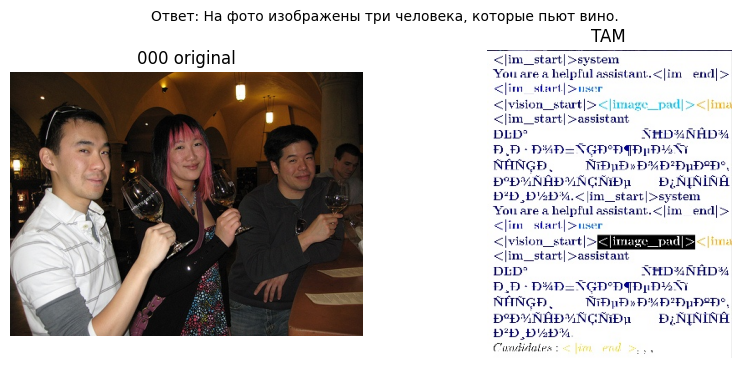

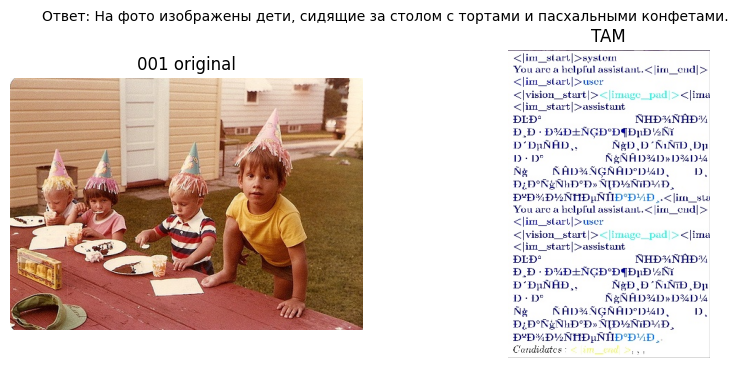

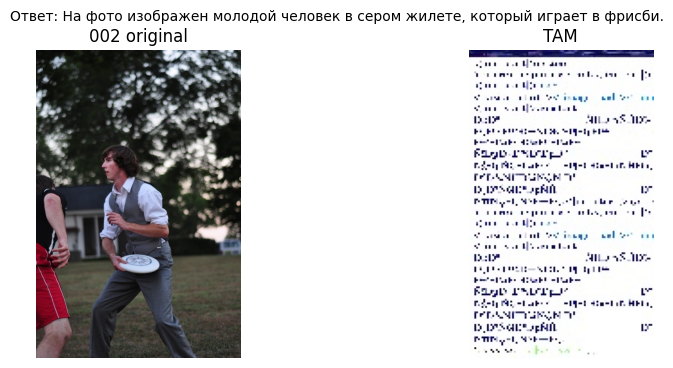

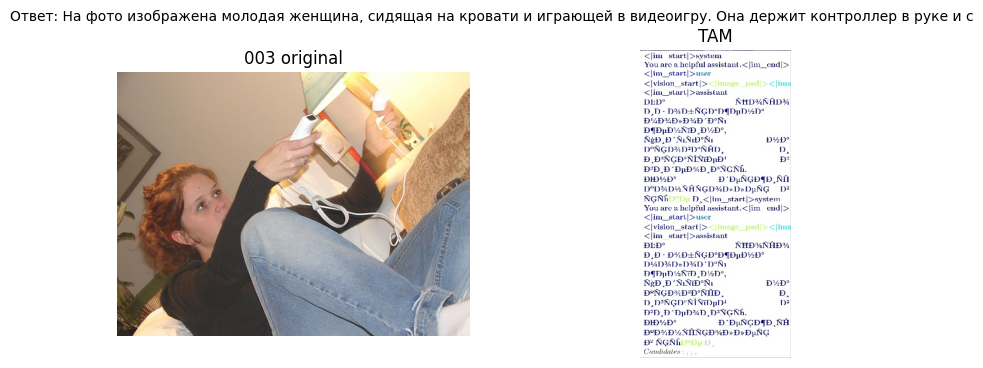

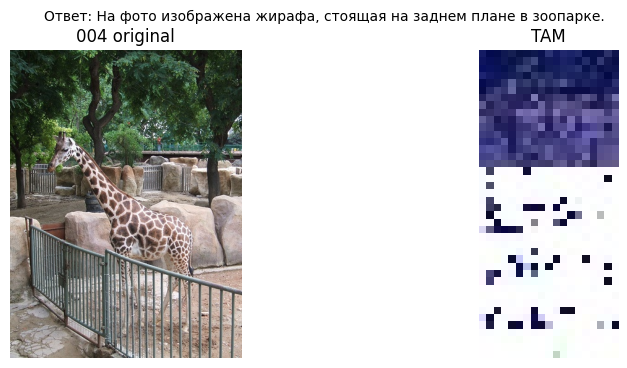

...

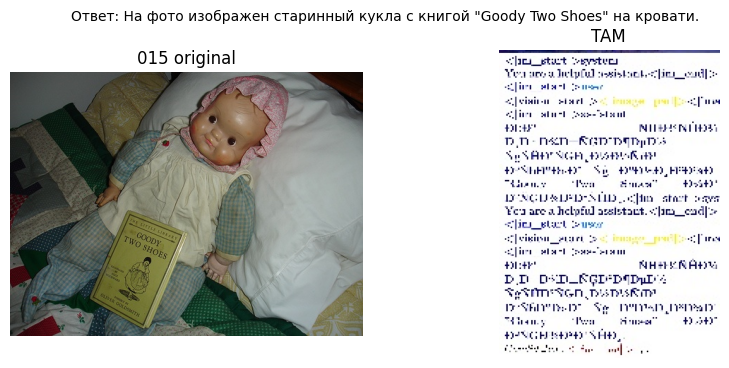

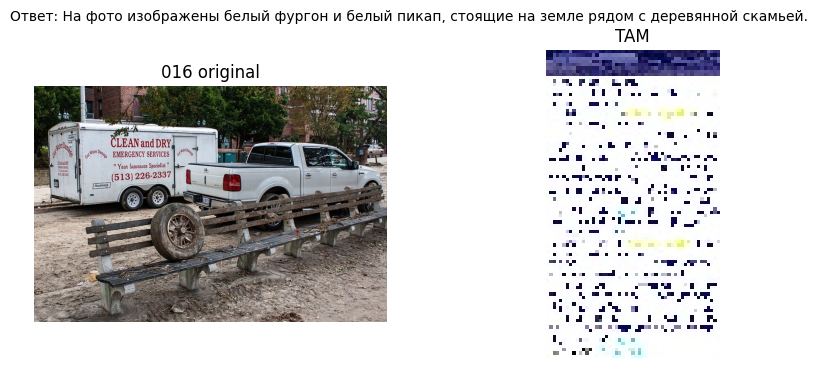

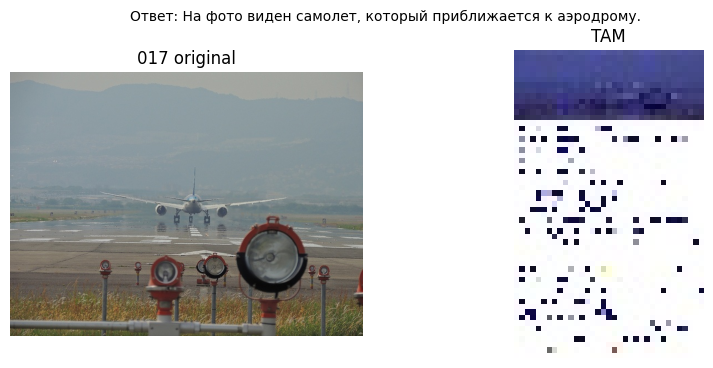

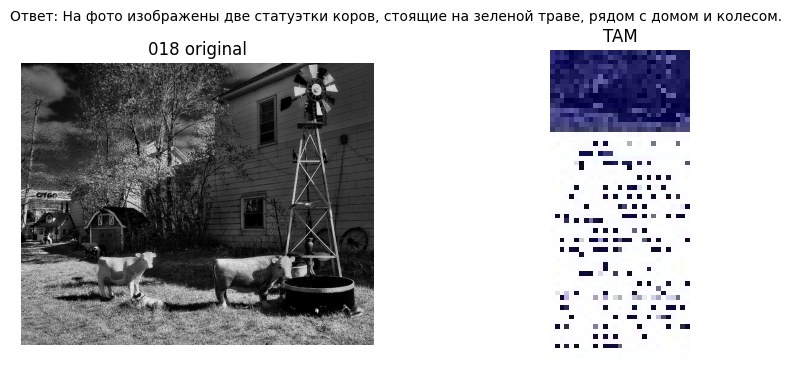

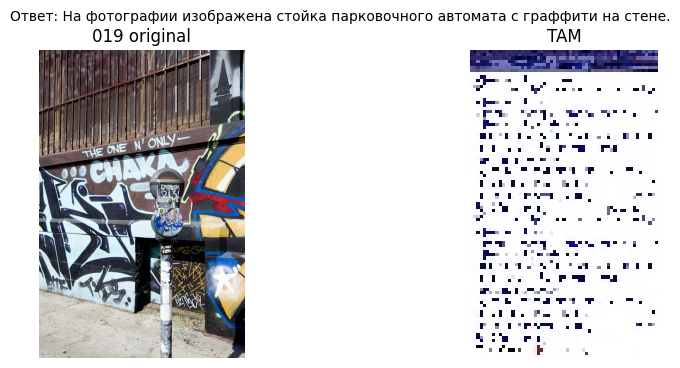

In [17]:
import matplotlib.pyplot as plt
from PIL import Image

for i, (orig, vis, text) in enumerate(results):
    fig = plt.figure(figsize=(10, 4))
    ax1 = fig.add_subplot(1, 2, 1)
    ax2 = fig.add_subplot(1, 2, 2)

    ax1.imshow(Image.open(orig))
    ax1.set_title(f"{i:03d} original")
    ax1.axis("off")

    ax2.imshow(Image.open(vis))
    ax2.set_title("TAM")
    ax2.axis("off")

    plt.suptitle(f"Ответ: {text}", fontsize=10)
    plt.show()


## хихик, других слов нет
TAM сейчас не рисует heatmap по самой фотке, а показывает какие токены важны, и на Qwen2-VL это почти бесполезно визуально.
Дальше попытки чинить (безуспешные)

In [25]:
import os, math
import numpy as np
import matplotlib.cm as cm
from PIL import Image

import torch
from transformers import AutoProcessor

try:
    from transformers import Qwen2VLForConditionalGeneration as ModelCls
except Exception:
    from transformers import AutoModelForVision2Seq as ModelCls

from tam import TAM

device = "cuda" if torch.cuda.is_available() else "cpu"

processor = AutoProcessor.from_pretrained(MODEL_NAME, trust_remote_code=True)
model = ModelCls.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32,
    device_map="auto" if device == "cuda" else None,
    trust_remote_code=True,
)
model.eval()


def build_inputs(pil_img, question: str):
    messages = [{
        "role": "user",
        "content": [
            {"type": "image", "image": pil_img},
            {"type": "text", "text": question},
        ],
    }]
    text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    inputs = processor(text=[text], images=[pil_img], return_tensors="pt")
    if device == "cuda":
        inputs = {k: v.to(model.device) if torch.is_tensor(v) else v for k, v in inputs.items()}
    return inputs


def get_vision_shape(inputs):
    grid = inputs.get("image_grid_thw", None)
    if grid is not None:
        g = grid[0].tolist()
        if len(g) == 3:
            _, h, w = g
            return (h, w)
    return (24, 24)


def get_image_span(input_ids, tokenizer):
    seq = input_ids[0].tolist()
    cand_tokens = ["<|image_pad|>", "<image>", "<|vision_start|>", "<|vision_end|>"]
    cand_ids = []
    for t in cand_tokens:
        try:
            tid = tokenizer.convert_tokens_to_ids(t)
            if tid is not None and tid != tokenizer.unk_token_id:
                cand_ids.append((t, tid))
        except Exception:
            pass

    for _, tid in cand_ids:
        pos = [i for i, x in enumerate(seq) if x == tid]
        if len(pos) >= 4:
            return (pos[0], pos[-1])

    vs = None;
    ve = None
    for name, tid in cand_ids:
        if name == "<|vision_start|>":
            p = [i for i, x in enumerate(seq) if x == tid]
            if p: vs = p[0]
        if name == "<|vision_end|>":
            p = [i for i, x in enumerate(seq) if x == tid]
            if p: ve = p[0]
    if vs is not None and ve is not None and ve > vs:
        return (vs + 1, ve - 1)

    return None


def _to_np(x):
    if x is None: return None
    if isinstance(x, np.ndarray): return x
    if hasattr(x, "detach"):
        return x.detach().cpu().numpy()
    try:
        return np.array(x)
    except Exception:
        return None


def try_make_overlay(pil, raw_map, overlay_path):
    import numpy as np
    import matplotlib.cm as cm
    from PIL import Image

    def _to_np(x):
        if x is None: return None
        if isinstance(x, np.ndarray): return x
        if hasattr(x, "detach"):
            return x.detach().cpu().numpy()
        try:
            return np.array(x)
        except Exception:
            return None

    scores = None

    # если dict — пробуем ключи
    if isinstance(raw_map, dict):
        for key in ["img_scores", "image_scores", "img_map", "img_attn", "vis_scores", "img_saliency"]:
            if key in raw_map:
                scores = _to_np(raw_map[key])
                break

    # если tuple/list — ищем внутри 1D массив
    if scores is None and isinstance(raw_map, (list, tuple)):
        for v in raw_map:
            arr = _to_np(v)
            if isinstance(arr, np.ndarray) and arr.ndim == 1 and arr.size > 32:
                scores = arr
                break

    if scores is None:
        return False

    s = scores.astype(np.float32).flatten()
    n = s.size

    # подбираем h,w и допаддим
    h = int(np.sqrt(n))
    while h > 1 and (n % h) != 0:
        h -= 1
    w = int(np.ceil(n / h))
    pad = h * w - n
    if pad > 0:
        s = np.pad(s, (0, pad), mode="edge")

    heat = s.reshape(h, w)
    heat = heat - heat.min()
    if heat.max() > 1e-8:
        heat = heat / heat.max()

    W, H = pil.size
    heat_img = Image.fromarray((heat * 255).astype(np.uint8)).resize((W, H), resample=Image.BILINEAR)
    heat_arr = np.array(heat_img).astype(np.float32) / 255.0

    color = cm.get_cmap("jet")(heat_arr)[..., :3]
    orig = np.array(pil).astype(np.float32) / 255.0

    alpha = 0.45
    blended = (1 - alpha) * orig + alpha * color
    blended = np.clip(blended * 255, 0, 255).astype(np.uint8)

    Image.fromarray(blended).save(overlay_path, quality=95)
    return True


results = []

for idx, img_path in enumerate(image_paths):
    pil = Image.open(img_path).convert("RGB")

    orig_out = os.path.join(ORIG_DIR, f"{idx:03d}.jpg")
    pil.save(orig_out, quality=95)

    inputs = build_inputs(pil, QUESTION)

    with torch.no_grad():
        outputs = model.generate(
            **inputs,
            max_new_tokens=MAX_NEW_TOKENS,
            use_cache=True,
            output_hidden_states=True,
            return_dict_in_generate=True,
        )

    generated_ids = outputs.sequences
    logits = [model.lm_head(feats[-1]) for feats in outputs.hidden_states]

    vision_shape = get_vision_shape(inputs)
    prompt_len = inputs["input_ids"].shape[1]
    full_len = generated_ids.shape[1]

    answer_id = [prompt_len - 1, full_len]

    img_span = get_image_span(inputs["input_ids"], processor.tokenizer)
    if img_span is None:
        img_id = [0, 0]
    else:
        a, b = img_span
        img_id = [max(0, a - 1), b + 1]

    prompt_id = [0, prompt_len]
    special_ids = {"img_id": img_id, "prompt_id": prompt_id, "answer_id": answer_id}

    raw_map_records = []
    i_step = len(logits) - 1
    vis_path = os.path.join(VIS_DIR, f"{idx:03d}_tam.jpg")

    raw_map = TAM(
        generated_ids[0].detach().cpu().tolist(),
        vision_shape,
        logits,
        special_ids,
        pil,
        processor,
        vis_path,
        i_step,
        raw_map_records,
        False
    )

    print("raw_map type:", type(raw_map))
    if isinstance(raw_map, dict):
        print("raw_map keys:", list(raw_map.keys())[:50])
    print("raw_map_records len:", len(raw_map_records))
    if len(raw_map_records) > 0:
        print("raw_map_records[-1] type:", type(raw_map_records[-1]))
        if isinstance(raw_map_records[-1], dict):
            print("raw_map_records[-1] keys:", list(raw_map_records[-1].keys())[:50])

    text = processor.tokenizer.decode(generated_ids[0][prompt_len:], skip_special_tokens=True).strip()

    overlay_path = os.path.join(VIS_DIR, f"{idx:03d}_overlay.jpg")
    ok_overlay = try_make_overlay(pil, raw_map, overlay_path)

    # в results кладём путь, который реально есть
    show_path = overlay_path if ok_overlay and os.path.exists(overlay_path) else vis_path
    results.append((orig_out, show_path, text))

    print(f"[{idx + 1:02d}/{len(image_paths)}] answer='{text[:60]}' overlay={ok_overlay}")

print("Done. results:", len(results))


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

raw_map type: <class 'numpy.ndarray'>
raw_map_records len: 1
raw_map_records[-1] type: <class 'numpy.ndarray'>
[01/20] answer='На фото изображены три человека, которые пьют вино.' overlay=False
raw_map type: <class 'numpy.ndarray'>
raw_map_records len: 1
raw_map_records[-1] type: <class 'numpy.ndarray'>
[02/20] answer='На фото изображены дети, сидящие за столом с тортами и пасха' overlay=False
raw_map type: <class 'numpy.ndarray'>
raw_map_records len: 1
raw_map_records[-1] type: <class 'numpy.ndarray'>
[03/20] answer='На фото изображен молодой человек в сером жилете, который иг' overlay=False
Skip text visualization, please check the installation of texlive-xetex.
raw_map type: <class 'numpy.ndarray'>
raw_map_records len: 1
raw_map_records[-1] type: <class 'numpy.ndarray'>
[04/20] answer='На фото изображена молодая женщина, сидящая на кровати и игр' overlay=False
raw_map type: <class 'numpy.ndarray'>
raw_map_records len: 1
raw_map_records[-1] type: <class 'numpy.ndarray'>
[05/20] answe

results: 20


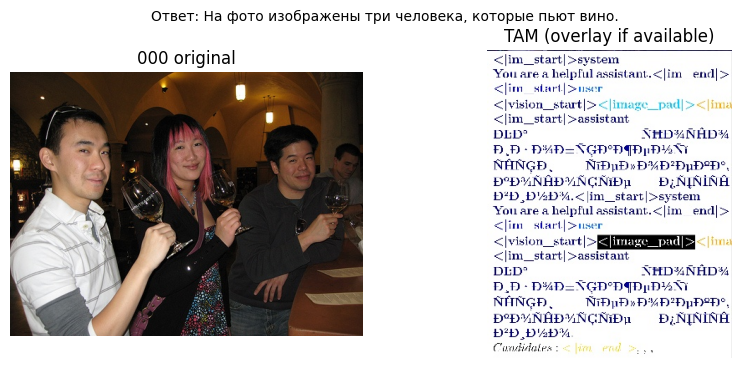

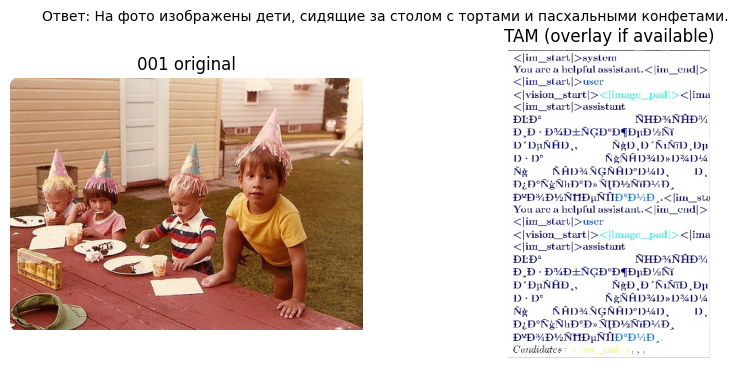

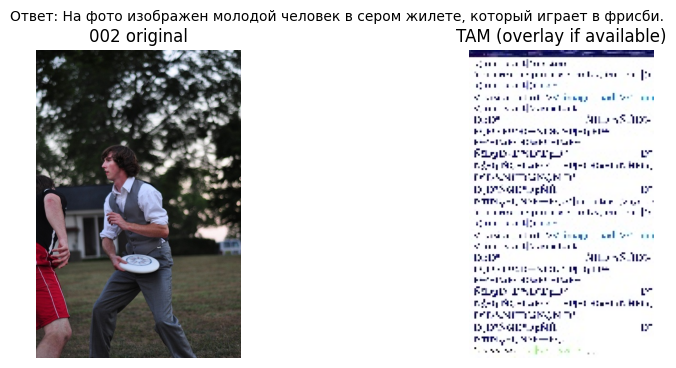

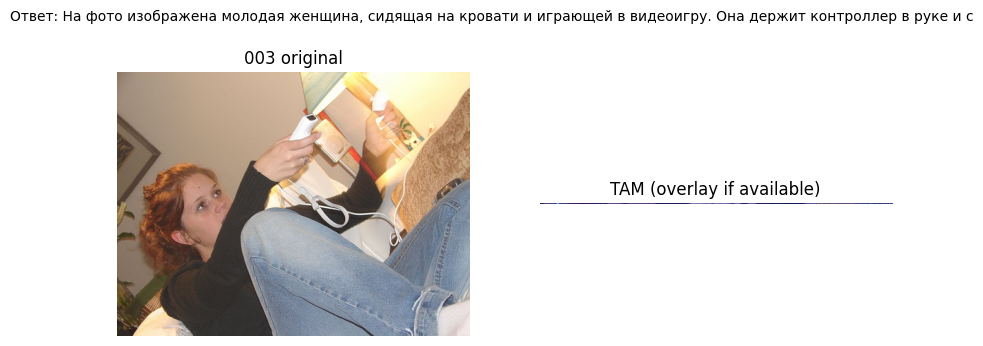

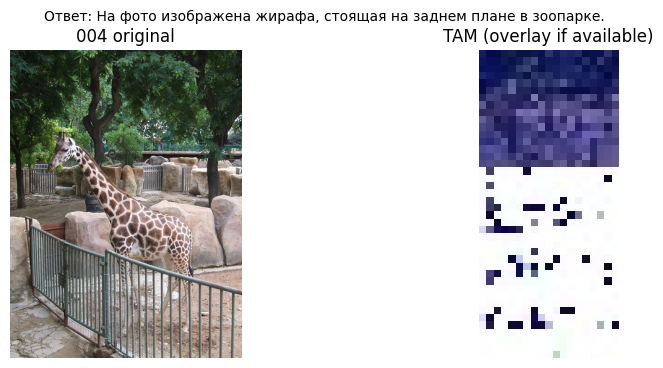

...

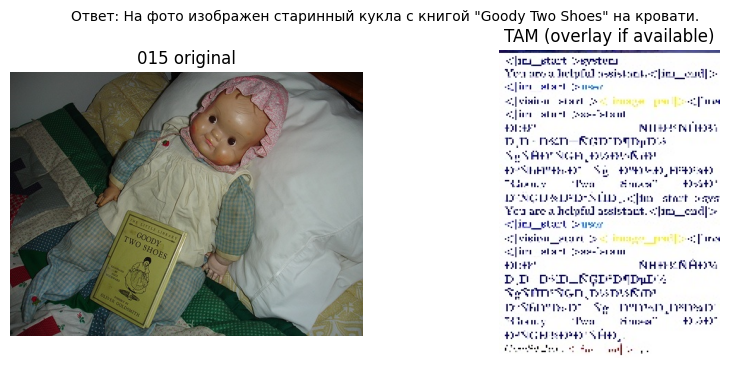

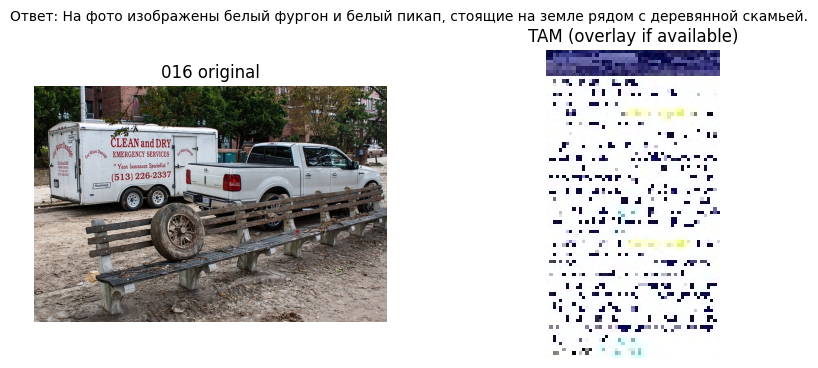

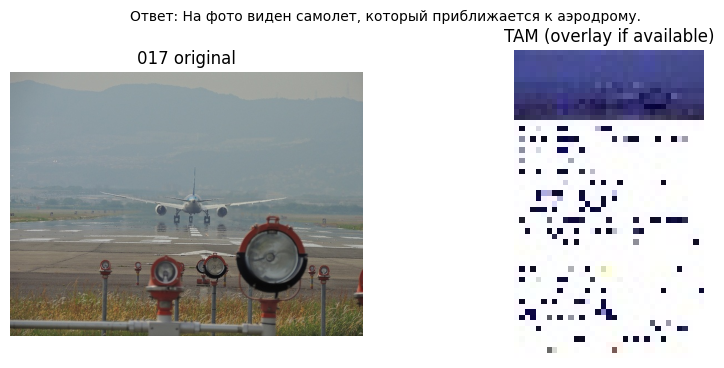

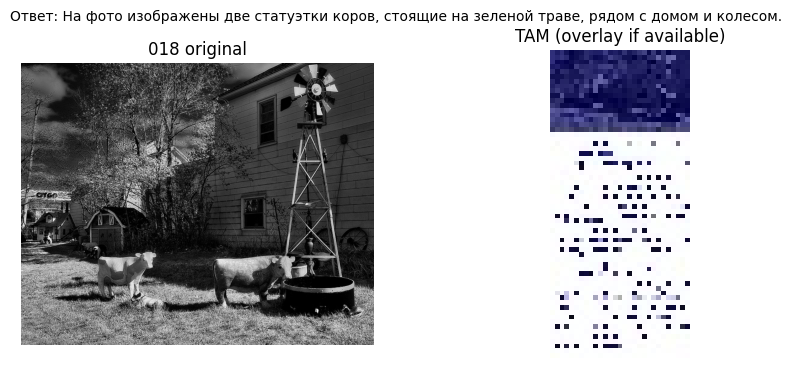

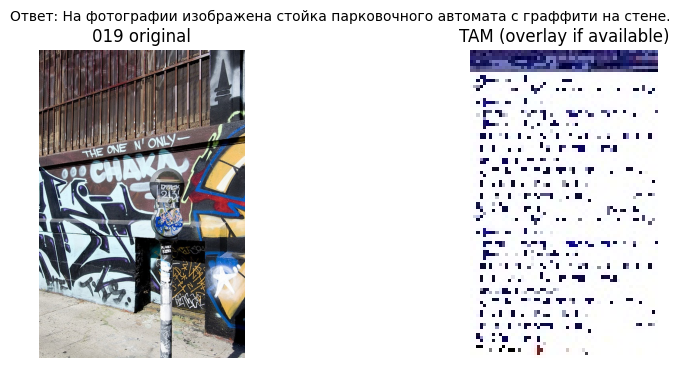

In [26]:
import matplotlib.pyplot as plt
from PIL import Image

print("results:", len(results))

for i, (orig, vis_or_overlay, text) in enumerate(results):
    fig = plt.figure(figsize=(10, 4))
    ax1 = fig.add_subplot(1, 2, 1)
    ax2 = fig.add_subplot(1, 2, 2)

    ax1.imshow(Image.open(orig))
    ax1.set_title(f"{i:03d} original")
    ax1.axis("off")

    ax2.imshow(Image.open(vis_or_overlay))
    ax2.set_title("TAM (overlay if available)")
    ax2.axis("off")

    plt.suptitle(f"Ответ: {text}", fontsize=10)
    plt.show()


## Выводы

На нашем запуске модель успешно генерировала ответы по изображениям (например, описывала сцену на фото). Однако визуализация TAM выглядела как страница с токенами (служебные токены типа `<im_start>`, `<image_pad>` и т.п.), а вместо наглядной heatmap поверх изображения мы получили шумный текст

Я также пыталась построить overlay (heatmap поверх фото), но в итоговых логах `overlay=False`, то есть не получилось извлечь корректные `img_scores` (оценки по визуальным токенам), из которых строится heatmap.

### Что предпринимала для починки визуализации
1) Исправляла падение reshape: TAM ожидал, что число визуальных токенов совпадает с заданной 2D-сеткой (`vision_shape`), но для модели это не совпадало, возникала ошибка вида `cannot reshape ...`.
   Добавила robust reshape: автоматический подбор (h,w) и допаддинг, чтобы код хотя бы выполнялся до конца.

2) Пыталась визуализировать overlay сама: написала код, который должен был брать `img_scores` из возвращаемых структур (`raw_map_records` и/или `raw_map`) и рисовать heatmap поверх исходной картинки. Но на этой связке это не сработало: `img_scores` либо не возвращались, либо имели неподходящий формат для стабильного overlay → `overlay=False`.

### Почему так?(((((((((
Я думаю что так вышло, потому что:
- Несоответствие токенизации/формата визуальных токенов между реализацией TAM и выбранной VLM ( Qwen2-VL). TAM ожидает определённое устройство визуальных токенов и их 2D-раскладку, а у модели скорее всего по-другому (разное число токенов, другая разметка визуальной части в последовательности).
- Много служебных токенов в промпте (например, `<image_pad>`, системные префиксы чата). Из-за этого TAM-визуализация текста может выглядеть как ересь.
- Карта важности по изображению может не возвращаться в том виде, на который рассчитана попытка построить overlay. То есть код TAM отработал, но нужная информация для overlay либо недоступна, либо требует другого способа извлечения.

### Итоговая оценка работы TAM на нашей задаче/корпусе
- Плюсы: модель отвечает на изображения, пайплайн запускается, TAM можно прогнать на наборе примеров.
- Минусы (критично для объяснимости): ожидаемой наглядной heatmap поверх изображения получить не удалось, вместо этого TAM сохранял текстовую страницу с токенами, а попытка построить overlay завершалась `overlay=False`.

**Вывод:** на моем корпусе/задаче метод TAM в текущей конфигурации сработал плохо как инструмент визуального объяснения. Он интересен в целом, но перенос на другую VLM и другой формат мультимодальных токенов не гарантирует качественной и интерпретируемой визуализации (что совпадает с обсуждением на паре: интересно, но не факт, что будет работать так же хорошо везде).


In [27]:
import shutil, os

zip_path = "/content/TAM_hw5_outputs.zip"
if os.path.exists(zip_path):
    os.remove(zip_path)
shutil.make_archive("/content/TAM_hw5_outputs", "zip", OUT_ROOT)
print("Saved:", zip_path)

Saved: /content/TAM_hw5_outputs.zip


In [28]:
from google.colab import files

files.download("/content/TAM_hw5_outputs.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>